<a href="https://colab.research.google.com/github/amnaahmed567/Dog_Breed_Identification_Project_Deep_Learning/blob/main/Project_Dog_Breed.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!kaggle competitions download -c dog-breed-identification

Traceback (most recent call last):
  File "/usr/local/bin/kaggle", line 5, in <module>
    from kaggle.cli import main
  File "/usr/local/lib/python3.10/dist-packages/kaggle/__init__.py", line 7, in <module>
    api.authenticate()
  File "/usr/local/lib/python3.10/dist-packages/kaggle/api/kaggle_api_extended.py", line 398, in authenticate
    raise IOError('Could not find {}. Make sure it\'s located in'
OSError: Could not find kaggle.json. Make sure it's located in /root/.kaggle. Or use the environment method.


In [ ]:
!unzip "/content/drive/MyDrive/Dog vision/dog-breed-identification.zip"

Streaming output truncated to the last 5000 lines.
  inflating: train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: train/83fad0718581a696132c96c166472627.jpg  
  inflating: train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: train/8406d837b2d7fac1c3cd621abb4c4f9e.jpg  
  inflating: train/840b67d26e5e43f8eb6430f62d4ba1ac.jpg  
  inflating: train/840db91ba4600148f3dcb06ec419b421.jpg  
  inflating: train/840dbad5a691c22611d85b2488bf4cbb.jpg  
  inflating: train/8410ced9ebc1759a7ebce5c42bfb5222.jpg  
  inflating: train/84

In [ ]:
import tensorflow as tf

In [ ]:
print(tf.__version__)

2.15.0


In [ ]:
import tensorflow_hub as hub

In [ ]:
import pandas as pd

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!ls "/content/drive/MyDrive/Dog vision"

dog-breed-identification.zip


In [ ]:
%cd /content/drive/MyDrive/Dog vision

/content/drive/MyDrive/Dog vision


In [ ]:
!unzip dog-breed-identification.zip -d /content/drive/MyDrive/dog_breed_identification/


Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/dog_breed_identification/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: /content/drive/MyDrive/dog_breed_identification/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: /content/drive/MyDrive/dog_breed_identification/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: /content/drive/MyDrive/dog_breed_identification/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: /content/drive/MyDrive/dog_breed_identification/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: /content/drive/MyDrive/dog_breed_identification/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: /content/drive/MyDrive/dog_breed_identification/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: /content/drive/MyDrive/dog_breed_identification/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: /content/drive/MyDrive/dog_breed_identification/train/83fad0718581a696132c96c166472627.j

In [ ]:
%cd dog_breed_identification


[Errno 2] No such file or directory: 'dog_breed_identification'
/content/drive/MyDrive/Dog vision


In [ ]:
import os
os.chdir('/content/drive/MyDrive/dog_breed_identification')

In [ ]:
!ls

dog-vision-prediction-probabilites-array.csv  labels.csv  models		 test
drive					      log	  sample_submission.csv  train


In [ ]:
import pandas as pd
label_csv = pd.read_csv("labels.csv")

In [ ]:
label_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
label_csv.describe()

,id,breed
count,10222,10222
unique,10222,120
top,000bec180eb18c7604dcecc8fe0dba07,scottish_deerhound
freq,1,126


<Axes: xlabel='breed'>

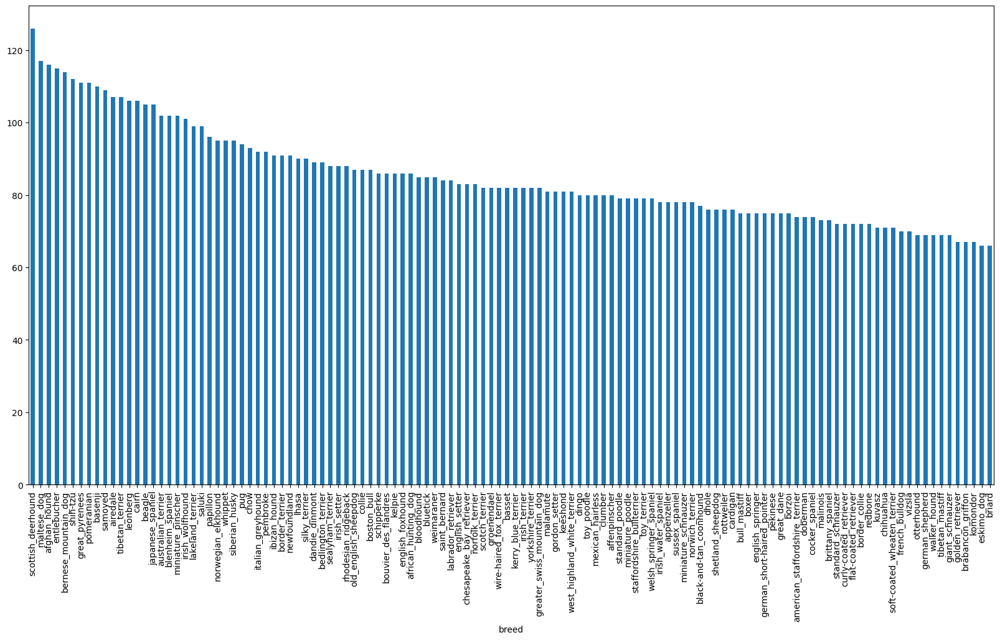

In [ ]:
label_csv['breed'].value_counts().plot.bar(figsize=(20,10))

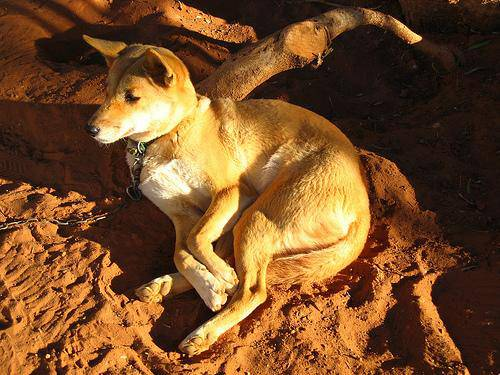

In [ ]:
from IPython import display
display.Image("train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")
#Images=("/content/drive/MyDrive/dog_breed_identification/train/001513dfcb2ffafc82cccf4d8bbaba97	")

In [ ]:
len(filenames)

10222

In [ ]:
len(os.listdir("/content/drive/MyDrive/dog_breed_identification/train"))

10222

In [ ]:
label_csv["breed"][9000]

'tibetan_mastiff'

In [ ]:
print(os.getcwd())


/content/drive/MyDrive/dog_breed_identification


In [ ]:
filenames = ["train/" + fname + ".jpg" for fname in label_csv["id"]]

In [ ]:
print(filenames[:5])


['train/000bec180eb18c7604dcecc8fe0dba07.jpg', 'train/001513dfcb2ffafc82cccf4d8bbaba97.jpg', 'train/001cdf01b096e06d78e9e5112d419397.jpg', 'train/00214f311d5d2247d5dfe4fe24b2303d.jpg', 'train/0021f9ceb3235effd7fcde7f7538ed62.jpg']


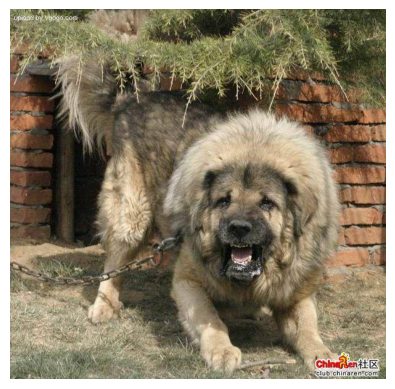

In [ ]:
import matplotlib.pyplot as plt
from PIL import Image

image_path = filenames[9000]

# Load and display the image
image = Image.open(image_path)
plt.imshow(image)
plt.axis('off')  # Hide the axis
plt.show()

In [ ]:
import numpy as np
label=label_csv["breed"]
label=np.array(label)
label

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(label)

10222

In [ ]:
if len(filenames)==len(label):
  print("file matches")

file matches


In [ ]:
unique_breed=np.unique(label)
len(unique_breed)

120

In [ ]:
label[0]==unique_breed[19]

True

In [ ]:
unique_breed==label[0]

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
boolean_labels=[unique_breed==label for label in label]

In [ ]:
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
X = filenames
Y = boolean_labels
NUM_IMAGES = 1000  # @param {type: "slider", min:1000,max:10000,step:100}

In [ ]:
from sklearn.model_selection import train_test_split
X_train,X_test,Y_train,Y_test=train_test_split(X[:NUM_IMAGES],Y[:NUM_IMAGES],test_size=0.2,random_state=42)

In [ ]:
len(X_train),len(Y_train)

(800, 800)

In [ ]:
len(X_test),len(X_test)

(200, 200)

In [ ]:
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

In [ ]:
#IMAGE_SIZE=224;
#def process_image(image_path,Image_size):
 # image=tf.io.read_file(image_path)
  #image = tf.image.decode_jpeg(image, channels=3)
  #image=tf.image.resize(image,size=[Image_size,Image_size])
  #return image
IMAGE_SIZE = 224

def process_image(image_path, image_size=IMAGE_SIZE):

    # Read the image file
    image = tf.io.read_file(image_path)

    # Decode the JPEG image
    image = tf.image.decode_jpeg(image, channels=3)

    # Resize the image
    image = tf.image.resize(image, [image_size, image_size])

    # Normalize the image to [0, 1]
    image = image / 255.0

    return image

In [ ]:
def get_image_label(image_path,label):
  image=process_image(image_path,IMAGE_SIZE)
  return image,label

In [ ]:
image = process_image(X[42], IMAGE_SIZE)
print(image, Y[42])

tf.Tensor(
[[[0.32641777 0.5222886  0.3232816 ]
  [0.25371668 0.44366494 0.24117756]
  [0.2569976  0.44670868 0.23893748]
  ...
  [0.29325104 0.5189916  0.3215547 ]
  [0.29721776 0.52466875 0.33030328]
  [0.2948505  0.5223015  0.33406618]]

 [[0.25903141 0.45378068 0.27294812]
  [0.24375683 0.44070187 0.2554778 ]
  [0.28389847 0.4721338  0.28298813]
  ...
  [0.2785345  0.50279915 0.3100471 ]
  [0.28428745 0.5108718  0.32523632]
  [0.28821915 0.5148035  0.32916805]]

 [[0.20941192 0.4069295  0.25792548]
  [0.24045376 0.43900943 0.28689107]
  [0.29001114 0.47937486 0.32247737]
  ...
  [0.26074055 0.48414767 0.30125177]
  [0.27101526 0.49454466 0.32096273]
  [0.27939945 0.50292885 0.32934693]]

 ...

 [[0.00634795 0.03442047 0.0258106 ]
  [0.01408936 0.04459917 0.0301715 ]
  [0.01385711 0.04856448 0.02839671]
  ...
  [0.42205158 0.39761975 0.2162212 ]
  [0.479325   0.4537054  0.2696505 ]
  [0.4818102  0.4582808  0.2700455 ]]

 [[0.00222061 0.02262166 0.03176915]
  [0.01008397 0.03669046 0

In [ ]:
BATCH_SIZE=32
def create_batches(X,Y=None,batch_size=BATCH_SIZE,valid_data=False,test_data=False):
  if test_data:
    print("creating test batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch=data.map(process_image).batch(batch_size)
    return data_batch
  elif valid_data:
    print("creating validation batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(Y)))
    data_batch=data.map(get_image_label).batch(batch_size)
    return data_batch
  else:
    print("creating training batches")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(Y)))
    data=data.shuffle(buffer_size=len(X))
    data=data.map(get_image_label)
    data_batch=data.batch(batch_size)
    return data_batch


In [ ]:
train_data=create_batches(X_train,Y_train)
valid_data=create_batches(X_test,Y_test,valid_data=True)

creating training batches
creating validation batches


In [ ]:
train_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [ ]:
valid_data.element_spec

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [ ]:
import matplotlib.pyplot as plt
def show_25_images(image,label):
  plt.figure(figsize=(10,10))
  for i in range(25):
    ax=plt.subplot(5,5,i+1)
    plt.imshow(image[i])
    plt.axis('off')
    plt.title(unique_breed[np.argmax(label[i])])

In [ ]:
train_images,train_labels=next(iter(train_data))
train_images,train_labels

(<tf.Tensor: shape=(32, 224, 224, 3), dtype=float32, numpy=
 array([[[[0.11836485, 0.12228642, 0.09875701],
          [0.12693061, 0.13085218, 0.10732277],
          [0.12503861, 0.12896018, 0.10543077],
          ...,
          [0.19669482, 0.20061639, 0.27841756],
          [0.21299882, 0.2461572 , 0.32007173],
          [0.39316782, 0.43630508, 0.50689334]],
 
         [[0.12654546, 0.13046703, 0.10693762],
          [0.11549369, 0.11941526, 0.09588585],
          [0.11935603, 0.1232776 , 0.09974819],
          ...,
          [0.18846293, 0.1923845 , 0.27018568],
          [0.17720482, 0.21036318, 0.28427774],
          [0.28954205, 0.3326793 , 0.40326753]],
 
         [[0.12573889, 0.12966046, 0.10613105],
          [0.11759453, 0.1215161 , 0.09798669],
          [0.12128805, 0.12520961, 0.1016802 ],
          ...,
          [0.17617303, 0.1800946 , 0.25789574],
          [0.17857248, 0.21173084, 0.28564537],
          [0.2410403 , 0.28417757, 0.3547658 ]],
 
         ...,
 
      

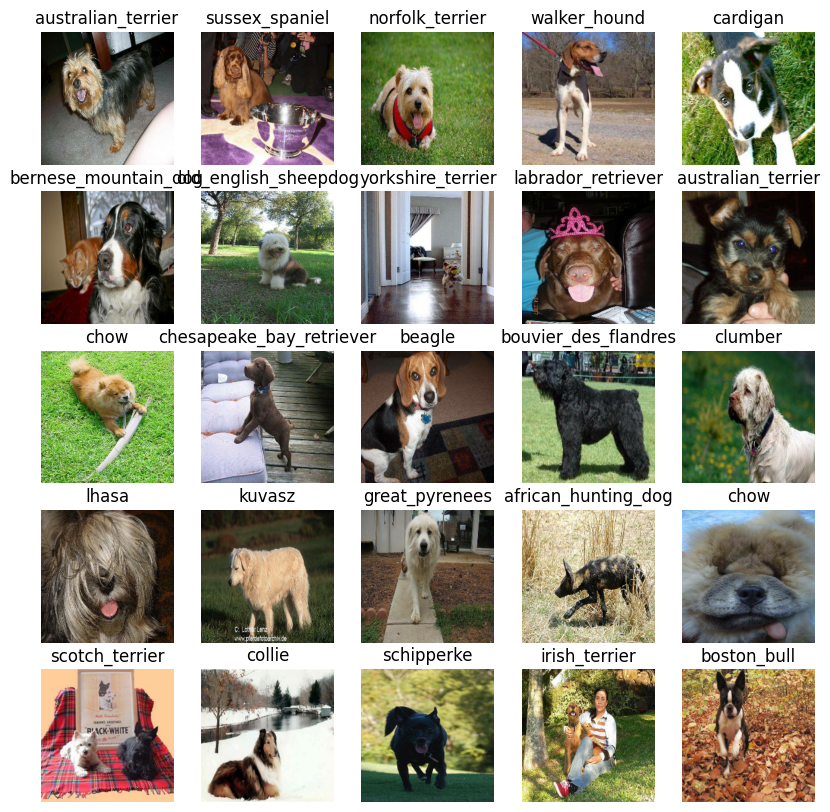

In [ ]:
show_25_images(train_images,train_labels)

In [ ]:
INPUT_SHAPE= [None,IMAGE_SIZE,IMAGE_SIZE,3]
OUTPUT_SHAPE= len(unique_breed)
MODEL_URL="https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1"


In [ ]:
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_utl=MODEL_URL):
    print("Building model with:", MODEL_URL)

    # SETTING UP THE MODEL LAYERS
    model = tf.keras.Sequential([
        hub.KerasLayer(MODEL_URL),
        tf.keras.layers.Dense(units=output_shape, activation='softmax')
    ])

    # COMPILING THE MODEL
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

    # BUILDING THE MODEL
    model.build(input_shape)

    return model

In [ ]:
model=create_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
%load_ext tensorboard

In [ ]:
import datetime
def create_tensorboard_callback():
  logdir=os.path.join("drive/MyDrive/dog_breed_identification/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  tensorboard_callback=tf.keras.callbacks.TensorBoard(logdir)
  return tensorboard_callback

In [ ]:
#creating early starting
early_stopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

In [ ]:
NUM_EPOCHS= 100 #@param{ type:'slider',min:10,max:100,step=10}

In [ ]:
def train_model():
  model=create_model()
  tensorboard=create_tensorboard_callback()
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=valid_data,
            callbacks=[tensorboard,early_stopping])
  return model

In [ ]:
model=train_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1
Epoch 1/100
25/25 [==============================] - 71s 3s/step - loss: 4.6695 - accuracy: 0.0812 - val_loss: 3.4712 - val_accuracy: 0.2300
Epoch 2/100
25/25 [==============================] - 70s 3s/step - loss: 1.6522 - accuracy: 0.6925 - val_loss: 2.1996 - val_accuracy: 0.4650
Epoch 3/100
25/25 [==============================] - 70s 3s/step - loss: 0.5719 - accuracy: 0.9337 - val_loss: 1.6722 - val_accuracy: 0.6200
Epoch 4/100
25/25 [==============================] - 70s 3s/step - loss: 0.2616 - accuracy: 0.9850 - val_loss: 1.4814 - val_accuracy: 0.6250
Epoch 5/100
25/25 [==============================] - 72s 3s/step - loss: 0.1527 - accuracy: 0.9925 - val_loss: 1.4113 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 74s 3s/step - loss: 0.1022 - accuracy: 0.9987 - val_loss: 1.3642 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================]

In [ ]:
%tensorboard --logdir drive/MyDrive/dog_breed_identification/logs

<IPython.core.display.Javascript object>

In [ ]:
valid_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
predictions=model.predict(valid_data,verbose=1)
predictions

7/7 [==============================] - 29s 3s/step


array([[1.61603815e-03, 4.77654648e-05, 1.83504060e-04, ...,
        3.63840983e-04, 3.60230224e-05, 7.17079081e-03],
       [9.18420032e-04, 3.32361599e-03, 9.36701987e-03, ...,
        1.95550834e-04, 2.37006461e-03, 5.08372847e-04],
       [4.69388669e-06, 6.67958329e-06, 3.65646019e-06, ...,
        2.48128599e-05, 1.54988775e-05, 7.76971501e-05],
       ...,
       [3.74356387e-06, 1.86710997e-04, 7.65560253e-06, ...,
        8.21740741e-06, 1.83294847e-04, 2.22623596e-04],
       [8.61321634e-04, 3.18722625e-04, 2.99737760e-04, ...,
        1.55467424e-04, 2.14192478e-05, 3.52377165e-03],
       [5.23905328e-04, 1.25534125e-05, 4.70105978e-03, ...,
        3.44185182e-03, 3.79420409e-04, 8.12100407e-05]], dtype=float32)

In [ ]:
len(predictions)

200

In [ ]:
np.sum(predictions[0])

1.0000001

In [ ]:
index = 0
print(predictions[index])
print(f"pred: {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max_index: {np.argmax(predictions[index])}")
print(f"Predicted breed: {unique_breed[np.argmax(predictions[index])]}")

[1.61603815e-03 4.77654648e-05 1.83504060e-04 3.21880478e-04
 2.20038695e-04 1.40240027e-05 4.89535555e-02 6.19897619e-04
 8.46615410e-04 6.67405489e-04 4.44863603e-04 8.25597381e-05
 4.97191686e-05 8.16457541e-05 1.45036902e-04 3.32826661e-04
 7.43300916e-05 2.62937039e-01 2.13498570e-05 3.49064881e-04
 1.05174351e-03 2.48395481e-05 7.45516945e-06 1.40257413e-03
 1.36224280e-05 1.37127048e-04 2.52967179e-01 8.44262649e-06
 1.03125593e-03 8.04025389e-04 7.12245470e-04 5.03533636e-04
 2.71049095e-04 5.73057659e-05 7.44615609e-05 8.24726298e-02
 4.45524638e-05 2.13104038e-04 1.77728420e-04 4.15366725e-04
 1.72623177e-03 9.29802482e-05 1.96625304e-04 1.15589290e-04
 1.66099780e-05 7.68637037e-05 7.72017811e-05 1.89886498e-03
 1.58875715e-04 2.85743608e-05 1.54813097e-04 1.00231191e-04
 8.47810006e-04 2.15275795e-04 2.31205137e-04 2.90423122e-05
 5.81752043e-04 3.80489510e-03 1.84544851e-03 2.25084983e-02
 1.05879072e-03 3.81716491e-05 2.22476455e-03 3.18270941e-05
 3.93305381e-04 2.235085

In [ ]:
def get_pred_label(predicition_probabilities):
  return unique_breed[np.argmax(predicition_probabilities)]

predict_label=get_pred_label(predictions[7])
predict_label


'old_english_sheepdog'

In [ ]:
def unbatchify(data):
  images=[]
  labels=[]
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breed[np.argmax(label)])

  return images,labels

In [ ]:
val_images,val_lables=unbatchify(valid_data)
val_lables[0],val_images[0]

('cairn',
 array([[[0.29599646, 0.43284866, 0.30566907],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934893],
         ...,
         [0.7761433 , 0.82320213, 0.8101595 ],
         [0.8129115 , 0.828535  , 0.84069437],
         [0.8209296 , 0.82637364, 0.8423667 ]],
 
        [[0.23448707, 0.31603682, 0.19543912],
         [0.3414841 , 0.3656084 , 0.27241895],
         [0.45016074, 0.40117088, 0.33964604],
         ...,
         [0.76639867, 0.81341374, 0.8135083 ],
         [0.73042476, 0.75012016, 0.7659072 ],
         [0.74518913, 0.7600257 , 0.7830808 ]],
 
        [[0.30157742, 0.30825868, 0.2101833 ],
         [0.29059538, 0.27066192, 0.18401103],
         [0.4138316 , 0.36170745, 0.29640046],
         ...,
         [0.7987162 , 0.84185344, 0.8606442 ],
         [0.79577374, 0.82859933, 0.8605654 ],
         [0.7518163 , 0.7790497 , 0.8155255 ]],
 
        ...,
 
        [[0.97467786, 0.9878955 , 0.9342279 ],
         [0.9915305 , 0.9977206

In [ ]:
get_pred_label(val_lables[7])

'affenpinscher'

In [ ]:
get_pred_label(predictions[7])

In [ ]:
val_lables[11]

'border_collie'

In [ ]:
def pred_plot(prediction_prob, labels, images, n=7):
    pred_prob = prediction_prob[n]
    true_label = labels[n]
    image = images[n]

    pred_label = get_pred_label(pred_prob)

    plt.imshow(image)
    plt.title(f"Pred: {pred_label} ({100 * np.max(pred_prob):.2f}%)\nTrue: {true_label}")
    plt.axis('off')
    plt.show()

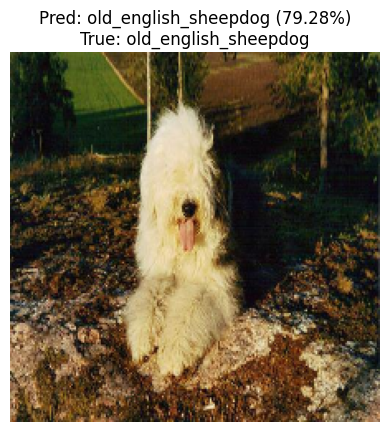

In [ ]:
pred_plot(predictions,val_lables,val_images)

In [ ]:
def plot_pred_conf(prediction_prob,labels,n=1):
  pred_prob=prediction_prob[n]
  true_label=labels[n]
  pred_label=get_pred_label(pred_prob)
  #finding the top 10 prediction index
  top_10_pred_index=np.argsort(pred_prob)[::-1][:10]
  #find the top 10 prediction confidence values
  top_10_pred_values=pred_prob[top_10_pred_index]
  #finding the top 10 prediction labels
  top_10_pred_labels=unique_breed[top_10_pred_index]

  #plotting top 10 predictions
  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),top_10_pred_values)
  plt.xticks(np.arange(len(top_10_pred_labels)),top_10_pred_labels,rotation='vertical')

  #changing color of true label
  if np.isin(true_label,top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color('green')
  else:
    pass



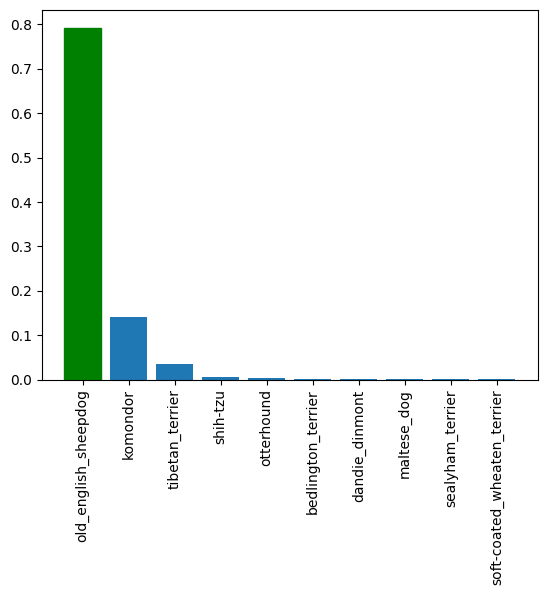

In [ ]:
plot_pred_conf(predictions,val_lables,n=7)

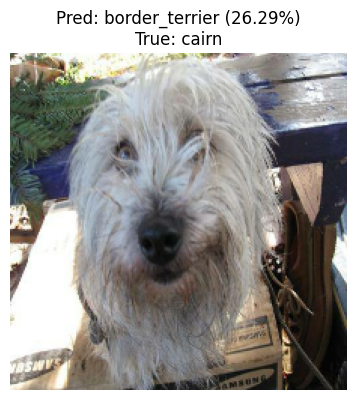

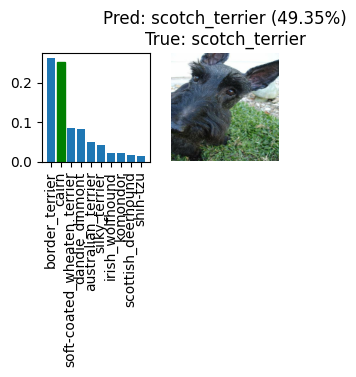

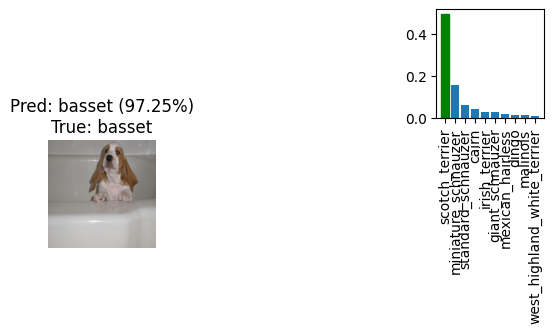

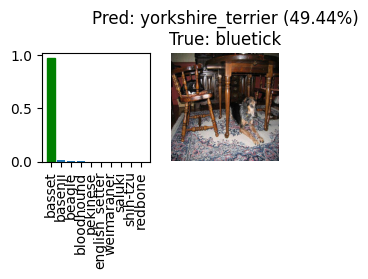

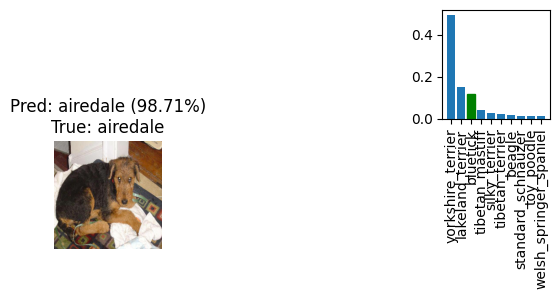

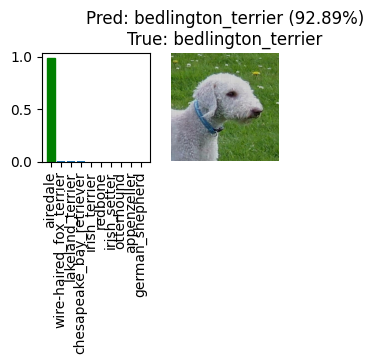

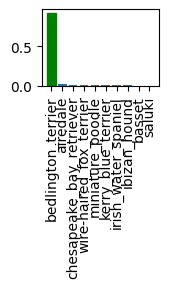

In [ ]:
i_multiplier = 0
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

plt.figure(figsize=(10 * num_cols, 5 * num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2 * num_cols, 2 * i +1 )
  pred_plot(predictions,val_lables, val_images, i + i_multiplier)
  plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
  plot_pred_conf(predictions, val_lables, i + i_multiplier)

plt.tight_layout(h_pad=1.0)
plt.show()



In [ ]:
def save_model(model,suffix=None):
  model_dir=os.path.join("drive/MyDrive/dog_breed_identification/models",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path=model_dir+'-'+suffix+'.h5'
  print(f"Saving model to: {model_path}")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  print(f"loading the saved model:{model_path}")
  model=tf.keras.models.load_model(model_path,custom_objects={'KerasLayer':hub.KerasLayer})
  return model


In [ ]:
save_model(model,suffix='1000-images-mobileV2-net')

Saving model to: drive/MyDrive/dog_breed_identification/models/20240709-063429-1000-images-mobileV2-net.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/dog_breed_identification/models/20240709-063429-1000-images-mobileV2-net.h5'

In [ ]:
load_model('drive/MyDrive/dog_breed_identification/models/20240708-125347-1000-images-mobileV2-net.h5')

loading the saved model:drive/MyDrive/dog_breed_identification/models/20240708-125347-1000-images-mobileV2-net.h5


In [ ]:
len(Y)

10222

In [ ]:
full_data=create_batches(X,Y)

creating training batches


In [ ]:
full_model=create_model()

Building model with: https://kaggle.com/models/google/mobilenet-v2/TensorFlow2/130-224-classification/1


In [ ]:
full_model_tensorboard=create_tensorboard_callback()
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)

In [ ]:
full_model.fit(x=full_data,epochs=100,callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 670s 2s/step - loss: 1.3617 - accuracy: 0.6647
Epoch 2/100
320/320 [==============================] - 669s 2s/step - loss: 0.3962 - accuracy: 0.8828
Epoch 3/100
320/320 [==============================] - 648s 2s/step - loss: 0.2336 - accuracy: 0.9370
Epoch 4/100
320/320 [==============================] - 640s 2s/step - loss: 0.1536 - accuracy: 0.9629
Epoch 5/100
320/320 [==============================] - 635s 2s/step - loss: 0.1067 - accuracy: 0.9785
Epoch 6/100
320/320 [==============================] - 640s 2s/step - loss: 0.0767 - accuracy: 0.9856
Epoch 7/100
320/320 [==============================] - 639s 2s/step - loss: 0.0590 - accuracy: 0.9914
Epoch 8/100
320/320 [==============================] - 657s 2s/step - loss: 0.0470 - accuracy: 0.9939
Epoch 9/100
320/320 [==============================] - 638s 2s/step - loss: 0.0365 - accuracy: 0.9966
Epoch 10/100
320/320 [==============================] - 651s 2s/step - loss: 0.030

In [ ]:
save_model(full_model,suffix='full_images-images-mobileV2-net')

In [ ]:
test_path="/test"
test_filenames = ["/test" + fname + ".jpg" for fname in os.listdir(test_path)]

In [ ]:
test_data=create_batches(test_filenames,test_data=True)
test_data

In [ ]:
#test_predicition=full_model.predict(test_data,verbose=1)
test_prediction=np.loadtxt("/content/drive/MyDrive/dog_breed_identification/dog-vision-prediction-probabilites-array.csv")